In [1]:
# importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('Datasets/Car details v3.csv')
df.drop(columns=['mileage', 'engine' ,'max_power' ,'torque' ,'seats'],inplace=True)
df.head(10)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner
3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner
5,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner
6,Maruti Wagon R LXI DUO BSIII,2007,96000,175000,LPG,Individual,Manual,First Owner
7,Maruti 800 DX BSII,2001,45000,5000,Petrol,Individual,Manual,Second Owner
8,Toyota Etios VXD,2011,350000,90000,Diesel,Individual,Manual,First Owner
9,Ford Figo Diesel Celebration Edition,2013,200000,169000,Diesel,Individual,Manual,First Owner


In [3]:
print("Shape of the dataframe : ",df.shape)
print("\nColumns names in the dataframe \n",df.columns)
print("\nColumns datatypes in the dataframe \n",df.dtypes)

Shape of the dataframe :  (8128, 8)

Columns names in the dataframe 
 Index(['name', 'year', 'selling_price', 'km_driven', 'fuel', 'seller_type',
       'transmission', 'owner'],
      dtype='object')

Columns datatypes in the dataframe 
 name             object
year              int64
selling_price     int64
km_driven         int64
fuel             object
seller_type      object
transmission     object
owner            object
dtype: object


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8128 entries, 0 to 8127
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   name           8128 non-null   object
 1   year           8128 non-null   int64 
 2   selling_price  8128 non-null   int64 
 3   km_driven      8128 non-null   int64 
 4   fuel           8128 non-null   object
 5   seller_type    8128 non-null   object
 6   transmission   8128 non-null   object
 7   owner          8128 non-null   object
dtypes: int64(3), object(5)
memory usage: 508.1+ KB


In [5]:
df.isnull().sum()

name             0
year             0
selling_price    0
km_driven        0
fuel             0
seller_type      0
transmission     0
owner            0
dtype: int64

In [6]:
#df[df.isnull().any(axis=1)]
# Droping nan values 
#df.dropna(inplace=True)

In [7]:
df.dtypes

name             object
year              int64
selling_price     int64
km_driven         int64
fuel             object
seller_type      object
transmission     object
owner            object
dtype: object

In [8]:
## removing the model name from the name column
df['name'] = df['name'].str.split(" ").str[0]

In [9]:
df['name'].value_counts()

name
Maruti           2448
Hyundai          1415
Mahindra          772
Tata              734
Toyota            488
Honda             467
Ford              397
Chevrolet         230
Renault           228
Volkswagen        186
BMW               120
Skoda             105
Nissan             81
Jaguar             71
Volvo              67
Datsun             65
Mercedes-Benz      54
Fiat               47
Audi               40
Lexus              34
Jeep               31
Mitsubishi         14
Force               6
Land                6
Isuzu               5
Kia                 4
Ambassador          4
Daewoo              3
MG                  3
Ashok               1
Opel                1
Peugeot             1
Name: count, dtype: int64

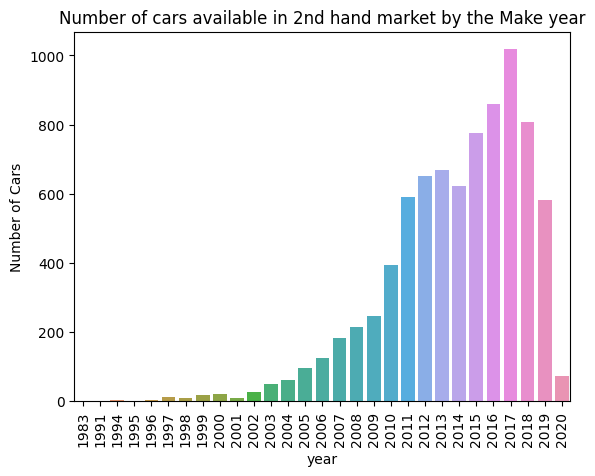

In [10]:
sns.barplot(x=df.groupby('year').count()['name'].index, y=df.groupby('year').count()['name'].values)
plt.xticks(rotation=90)
plt.ylabel('Number of Cars')
plt.title('Number of cars available in 2nd hand market by the Make year')
plt.show()

In [11]:
df['seller_type'].value_counts()

seller_type
Individual          6766
Dealer              1126
Trustmark Dealer     236
Name: count, dtype: int64

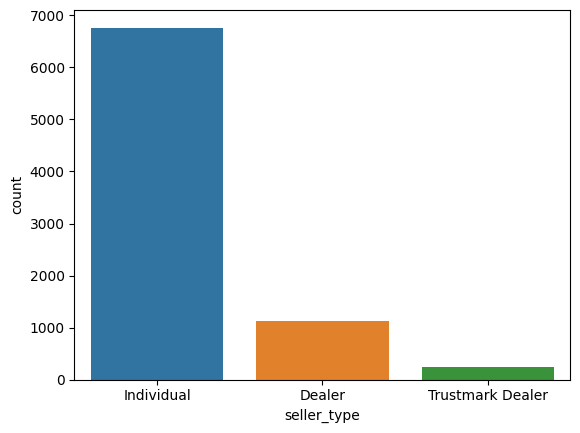

In [12]:
sns.countplot(x=df['seller_type'])
plt.show()

In [13]:
df['transmission'].value_counts()

transmission
Manual       7078
Automatic    1050
Name: count, dtype: int64

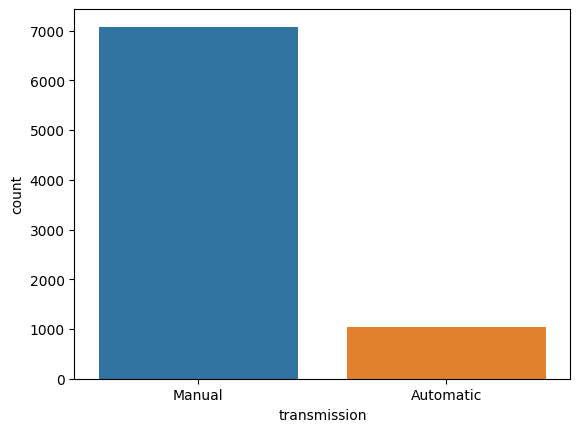

In [14]:
sns.countplot(x=df['transmission'])
plt.show()

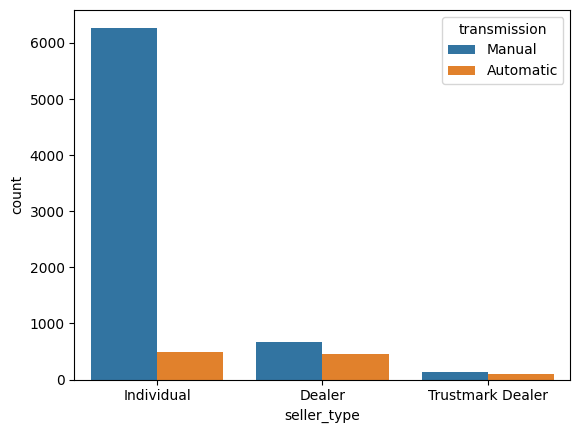

In [15]:
sns.countplot(data=df, x = 'seller_type', hue='transmission')
plt.show()
#bivariate analysis

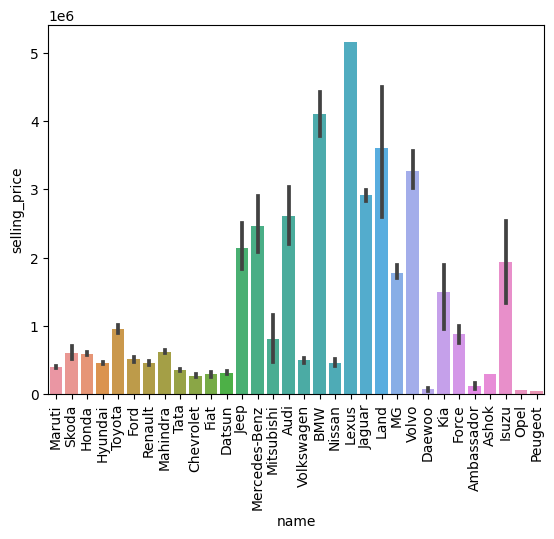

In [16]:
sns.barplot(data=df, x = 'name', y = 'selling_price') # ,orient='h'
plt.xticks(rotation=90)
plt.show()

In [17]:
df['fuel'].value_counts()

fuel
Diesel    4402
Petrol    3631
CNG         57
LPG         38
Name: count, dtype: int64

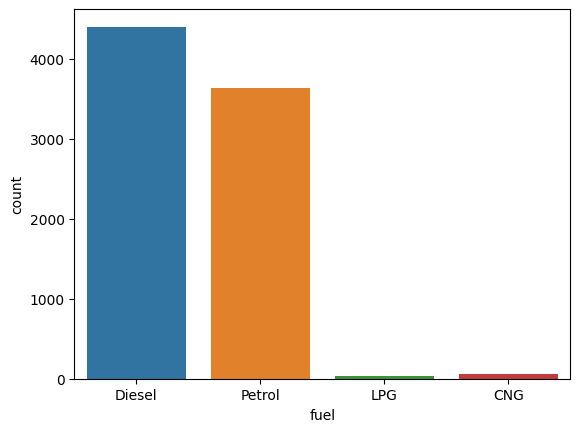

In [18]:
sns.countplot(x=df['fuel'])
plt.show()

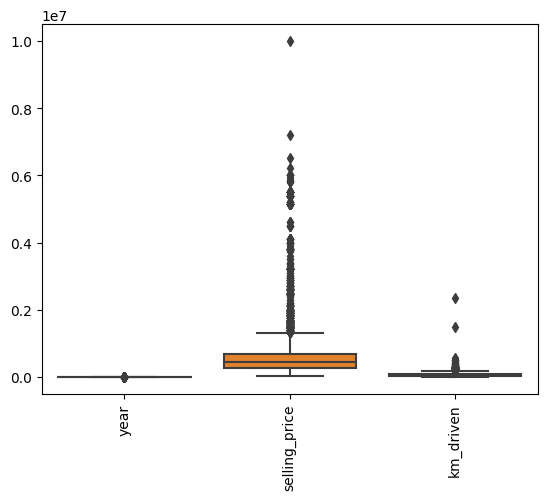

In [19]:
sns.boxplot(df)
plt.xticks(rotation=90)
plt.show()

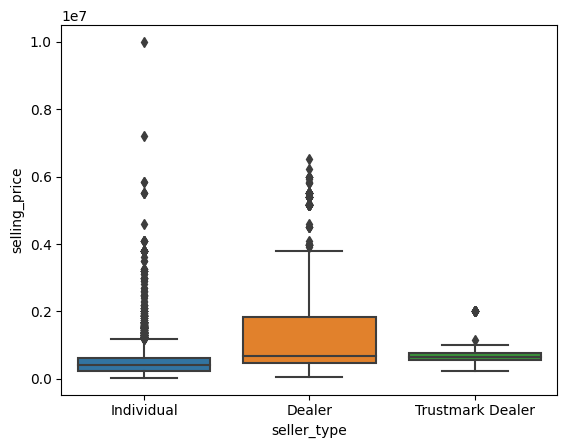

In [20]:
sns.boxplot(x=df['seller_type'],y=df['selling_price'])
# plt.xticks(rotation=90)
plt.show()

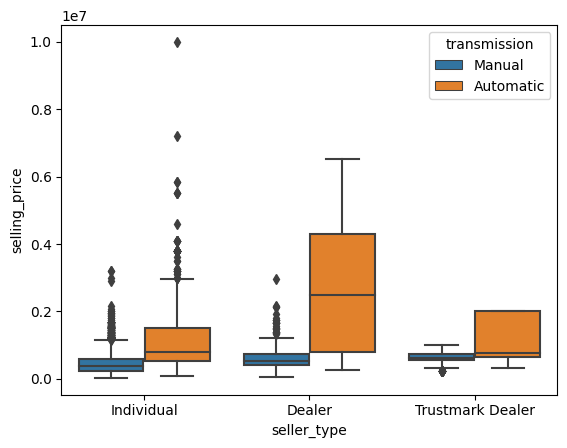

In [21]:
sns.boxplot(x=df['seller_type'],y=df['selling_price'], hue=df['transmission'])
# plt.xticks(rotation=90)
plt.show()


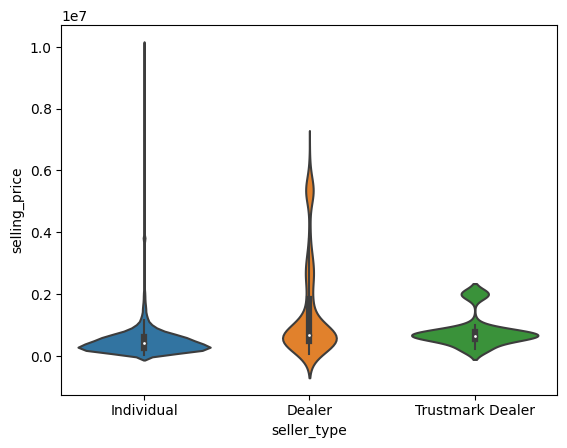

In [22]:
sns.violinplot(x=df['seller_type'],y=df['selling_price'])
# plt.xticks(rotation=90)
plt.show()

In [23]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
from sklearn import metrics
import seaborn as sns

In [24]:
# converting catergorical to numerical values

name_LabelEncoder = LabelEncoder()
df['name'] = name_LabelEncoder.fit_transform(df['name'])

fuel_LabelEncoder = LabelEncoder()
df['fuel'] = fuel_LabelEncoder.fit_transform(df['fuel'])

seller_LabelEncoder = LabelEncoder()
df['seller_type'] = seller_LabelEncoder.fit_transform(df['seller_type'])

transmission_LabelEncoder = LabelEncoder()
df['transmission'] = transmission_LabelEncoder.fit_transform(df['transmission'])

owner_LabelEncoder = LabelEncoder()
df['owner'] = owner_LabelEncoder.fit_transform(df['owner'])


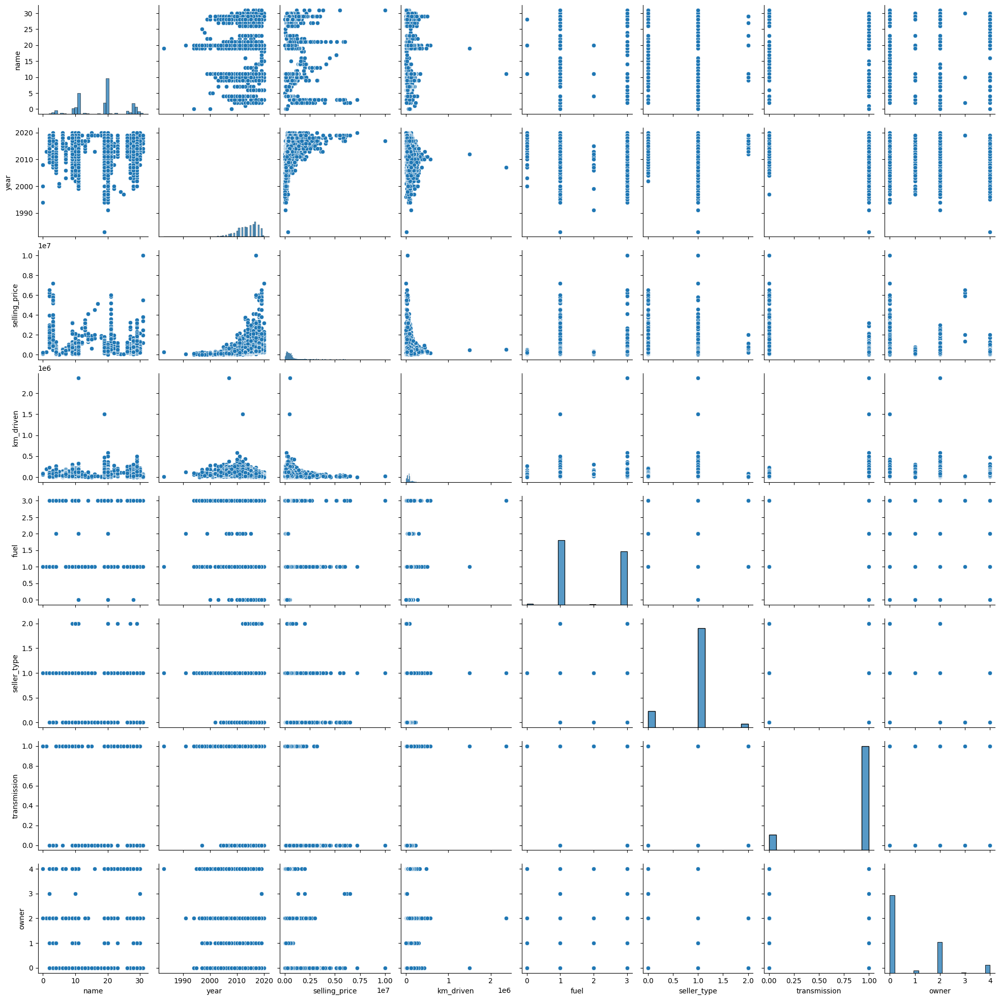

In [25]:
sns.pairplot(df)
plt.show()

In [26]:
c = df.corr()
c

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner
name,1.000000,-0.031469,-0.090271,0.102903,-0.122763,0.104609,0.052466,0.008371
year,-0.031469,1.000000,0.414092,-0.418006,-0.050312,-0.146042,-0.244707,-0.477249
selling_price,-0.090271,0.414092,1.000000,-0.225534,-0.194029,-0.335857,-0.588845,-0.229174
km_driven,0.102903,-0.418006,-0.225534,1.000000,-0.265877,0.122105,0.201229,0.280340
fuel,-0.122763,-0.050312,-0.194029,-0.265877,1.000000,0.110512,-0.035255,-0.022339
seller_type,0.104609,-0.146042,-0.335857,0.122105,0.110512,1.000000,0.227871,0.143443
transmission,0.052466,-0.244707,-0.588845,0.201229,-0.035255,0.227871,1.000000,0.147458
owner,0.008371,-0.477249,-0.229174,0.280340,-0.022339,0.143443,0.147458,1.000000


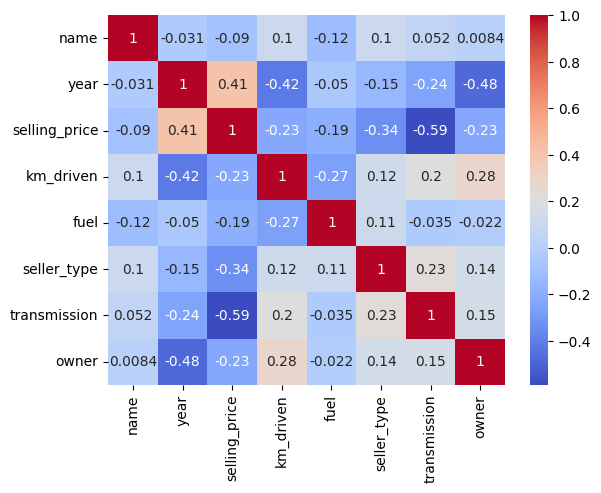

In [27]:
sns.heatmap(c, annot=True, cmap='coolwarm')
plt.show()

In [28]:
# splitting the dataset

X_train,X_test ,Y_train ,Y_test = train_test_split(df.drop(columns=['selling_price']),
                                                   df['selling_price'].to_numpy(),test_size=0.2,random_state=100)
print("Train shape ",X_train.shape)
print("Test shape ",X_test.shape)


Train shape  (6502, 7)
Test shape  (1626, 7)


In [29]:
# scaling the features

Y_scaler = MinMaxScaler()
Y_train_scaled = Y_scaler.fit_transform(Y_train.reshape(-1,1))
Y_test_scaled = Y_scaler.transform(Y_test.reshape(-1,1))

km_scaler = MinMaxScaler()
X_train['km_driven'] = km_scaler.fit_transform(X_train['km_driven'].to_numpy().reshape(-1,1))
X_test['km_driven'] = km_scaler.transform(X_test['km_driven'].to_numpy().reshape(-1,1))


In [30]:
X_train = X_train.to_numpy()
X_test  = X_test.to_numpy()


In [31]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor

# Decision Tree Regressor

In [32]:
tree = DecisionTreeRegressor()
tree.fit(X_train, Y_train_scaled)

DecisionTreeRegressor()

In [33]:
print("Training accuracy of the model is {:.2f}".format(tree.score(X_train, Y_train_scaled)))
print("Testing accuracy of the model is {:.2f}".format(tree.score(X_test, Y_test_scaled)))

Training accuracy of the model is 0.99
Testing accuracy of the model is 0.85


In [34]:
training_data_predction = tree.predict(X_train)
r_train_score1 = metrics.r2_score(Y_train_scaled, training_data_predction)
print("R squared score of Training Set : ", r_train_score1)

test_data_predction = tree.predict(X_test)
r2_test_dt = metrics.r2_score(Y_test_scaled, test_data_predction)
print("R squared score of Test Set : ", r2_test_dt)

mae_test_dt = metrics.mean_absolute_error(Y_test_scaled, test_data_predction)
print("Mean Absolute Error score of Test Set : ", mae_test_dt)

mse_test_dt = metrics.mean_squared_error(Y_test_scaled, test_data_predction)
print("Mean Squared Error score of Test Set : ", mse_test_dt)

R squared score of Training Set :  0.9921598263687851
R squared score of Test Set :  0.8465546548401526
Mean Absolute Error score of Test Set :  0.014021586838775515
Mean Squared Error score of Test Set :  0.0009306838916407335


In [35]:
from sklearn.tree import export_graphviz,plot_tree
from graphviz import Source

# Plot the decision tree graph
export_graphviz( tree,out_file="output images/cars dt.dot", feature_names=df.drop(columns=['selling_price']).columns,class_names=Y_train_scaled, rounded=True,filled=True)
 
with open("output images/cars dt.dot") as f:
    dot_graph = f.read()
     
Source(dot_graph)


# Linear Regression

In [36]:
linear = LinearRegression()
linear.fit(X_train,Y_train_scaled)

LinearRegression()

In [37]:
print("Training accuracy of the model is {:.2f}".format(linear.score(X_train, Y_train_scaled)))
print("Testing accuracy of the model is {:.2f}".format(linear.score(X_test, Y_test_scaled)))

Training accuracy of the model is 0.49
Testing accuracy of the model is 0.53


In [38]:
training_data_predction = linear.predict(X_train)
r_train_score1 = metrics.r2_score(Y_train_scaled, training_data_predction)
print("R squared score of Training Set : ", r_train_score1)

test_data_predction = linear.predict(X_test)
r2_test_lin = metrics.r2_score(Y_test_scaled, test_data_predction)
print("R squared score of Test Set : ", r2_test_lin)

mae_test_lin = metrics.mean_absolute_error(Y_test_scaled, test_data_predction)
print("Mean Absolute Error score of Test Set : ", mae_test_lin)

mse_test_lin = metrics.mean_squared_error(Y_test_scaled, test_data_predction)
print("Mean Squared Error score of Test Set : ", mse_test_lin)

R squared score of Training Set :  0.48838716430296136
R squared score of Test Set :  0.525930684953015
Mean Absolute Error score of Test Set :  0.030744413100641427
Mean Squared Error score of Test Set :  0.002875347405134826


# Gradient Boosting Regressor

In [39]:
grad = GradientBoostingRegressor()
grad.fit(X_train,Y_train_scaled.reshape(-1))

GradientBoostingRegressor()

In [40]:
print("Training accuracy of the model is {:.2f}".format(grad.score(X_train, Y_train_scaled)))
print("Testing accuracy of the model is {:.2f}".format(grad.score(X_test, Y_test_scaled)))

Training accuracy of the model is 0.91
Testing accuracy of the model is 0.88


In [41]:
training_data_predction = grad.predict(X_train)
r_train_score1 = metrics.r2_score(Y_train_scaled, training_data_predction)
print("R squared score of Training Set : ", r_train_score1)

test_data_predction = grad.predict(X_test)
r2_test_grad = metrics.r2_score(Y_test_scaled, test_data_predction)
print("R squared score of Test Set : ", r2_test_grad)

mae_test_grad = metrics.mean_absolute_error(Y_test_scaled, test_data_predction)
print("Mean Absolute Error score of Test Set : ", mae_test_grad)

mse_test_grad = metrics.mean_squared_error(Y_test_scaled, test_data_predction)
print("Mean Squared Error score of Test Set : ", mse_test_grad)

R squared score of Training Set :  0.9062073754262827
R squared score of Test Set :  0.8783464865429869
Mean Absolute Error score of Test Set :  0.015164050813344774
Mean Squared Error score of Test Set :  0.0007378585855308713


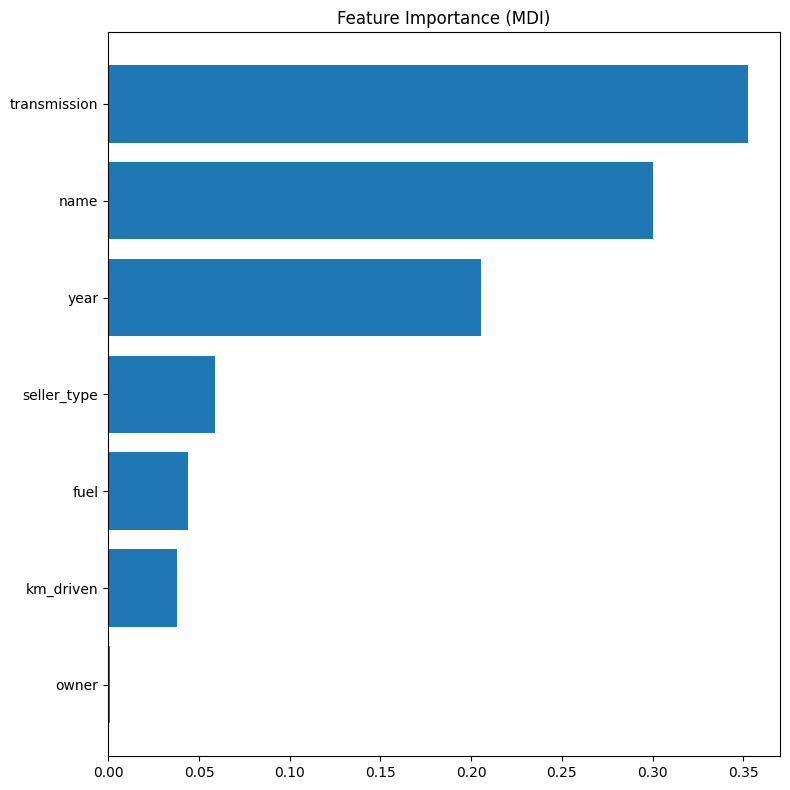

<Figure size 640x480 with 0 Axes>

In [42]:
#from sklearn.tree import export_graphviz,plot_tree
#plot_tree(grad)
#plt.show()
#fig.savefig('GBR.png')

from sklearn.inspection import permutation_importance

names=df.drop(columns=['selling_price']).columns
#cn=Y_train_scaled

feature_importance = grad.feature_importances_
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + .5

fig = plt.figure(figsize=(8, 8))
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, names[sorted_idx])
plt.title('Feature Importance (MDI)')
result = permutation_importance(grad, X_test, Y_test_scaled, n_repeats=10,
                                random_state=42, n_jobs=2)
sorted_idx = result.importances_mean.argsort()
fig.tight_layout()
plt.show()
plt.savefig('output images/feature import GBR car.png')

# Random Forest Regressor

In [43]:
rf = RandomForestRegressor()
rf.fit(X_train,Y_train_scaled.reshape(-1))

RandomForestRegressor()

In [44]:
print("Training accuracy of the model is {:.2f}".format(rf.score(X_train, Y_train_scaled)))
print("Testing accuracy of the model is {:.2f}".format(rf.score(X_test, Y_test_scaled)))

Training accuracy of the model is 0.98
Testing accuracy of the model is 0.90


In [45]:
training_data_predction = rf.predict(X_train)
r_train_score1 = metrics.r2_score(Y_train_scaled, training_data_predction)
print("R squared score of Training Set : ", r_train_score1)

test_data_predction = rf.predict(X_test)
r2_test_rf = metrics.r2_score(Y_test_scaled, test_data_predction)
print("R squared score of Test Set : ", r2_test_rf)

mae_test_rf = metrics.mean_absolute_error(Y_test_scaled, test_data_predction)
print("Mean Absolute Error score of Test Set : ", mae_test_rf)

mse_test_rf = metrics.mean_squared_error(Y_test_scaled, test_data_predction)
print("Mean Squared Error score of Test Set : ", mse_test_rf)

R squared score of Training Set :  0.9806680766736959
R squared score of Test Set :  0.9010815126916364
Mean Absolute Error score of Test Set :  0.012722176667178736
Mean Squared Error score of Test Set :  0.000599965040499987


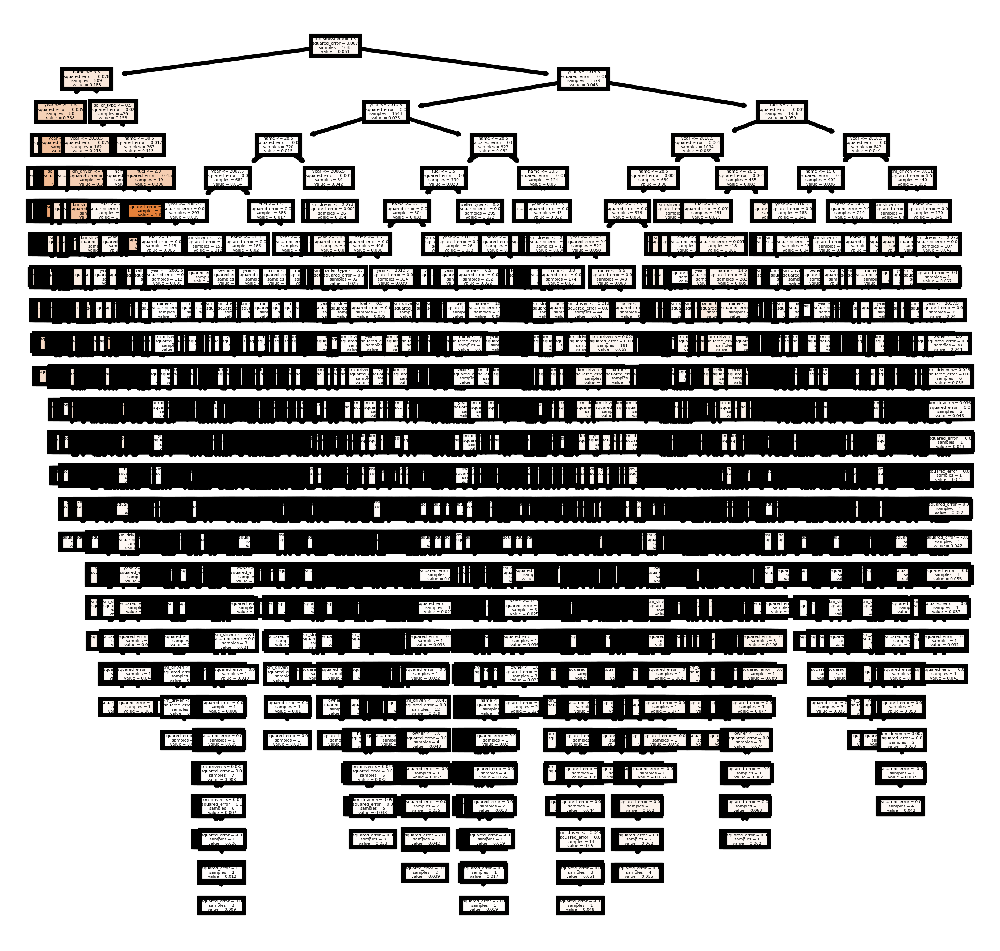

In [46]:

fn=df.drop(columns=['selling_price']).columns
cn=Y_train_scaled
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=800)
plot_tree(rf.estimators_[0],
               feature_names = fn, 
               class_names=cn,
               filled = True);
fig.savefig('output images/rf_individualtree.png')

# Performance analysis

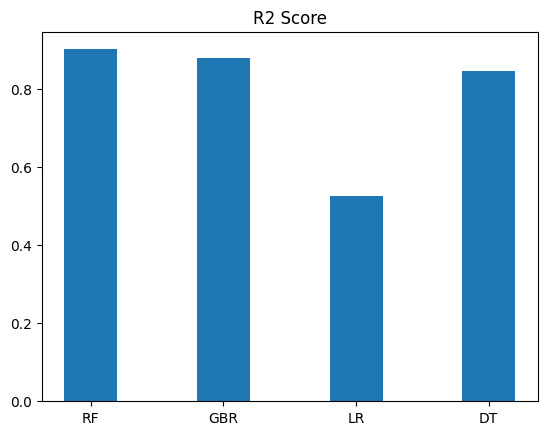

<Figure size 640x480 with 0 Axes>

In [47]:
# R2 score

r2 = [ r2_test_rf,r2_test_grad,r2_test_lin,r2_test_dt ]
names = ['RF' , "GBR" , 'LR', "DT"]
x = np.arange(len(r2))
plt.figure()
plt.bar(x,r2,0.4)
plt.xticks(x,names)
plt.title("R2 Score")
plt.show()
plt.savefig('output images/r2 score car.png')

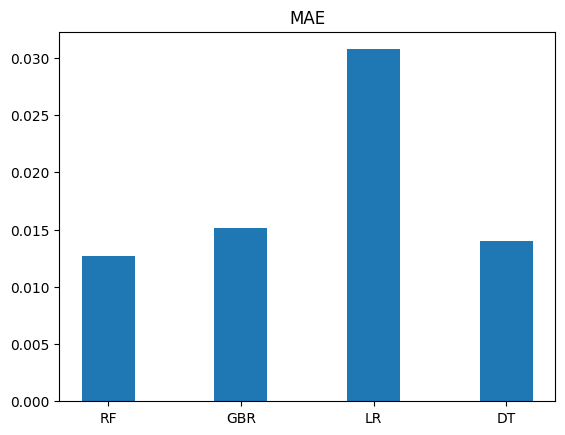

<Figure size 640x480 with 0 Axes>

In [48]:
# Mean Absolute Error

mae = [ mae_test_rf,mae_test_grad,mae_test_lin,mae_test_dt ]

plt.figure()
plt.title("MAE")
plt.bar(x,mae,0.4)
plt.xticks(x,names)
plt.show()
plt.savefig('output images/mae car.png')

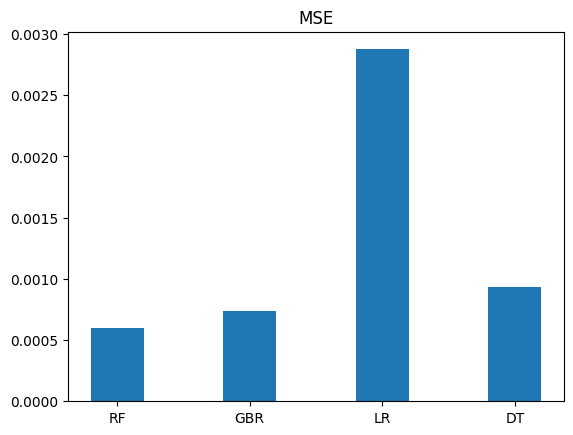

<Figure size 640x480 with 0 Axes>

In [49]:
# Mean Squared Error

mse = [ mse_test_rf,mse_test_grad,mse_test_lin,mse_test_dt ]

plt.figure()
plt.title("MSE")
plt.bar(x,mse,0.4)
plt.xticks(x,names)
plt.show()
plt.savefig('output images/mse car.png')